In [10]:
output = !CUDA_VISIBLE_DEVICES=0 python3 demo.py \
--Transformation TPS --FeatureExtraction ResNet --SequenceModeling BiLSTM --Prediction Attn \
--image_folder data/test \
--saved_model saved_models/TPS-ResNet-BiLSTM-Attn-Seed2222/best_accuracy.pth

In [12]:
type(output)

IPython.utils.text.SList

,img,id,label,conf
0,,data/test/aakndb.jpg,00178,0.7851
1,,data/test/abokgn.jpg,00499,0.4873
2,,data/test/achlcj.jpg,01271,0.9802
3,,data/test/acipag.jpg,0205,0.9490
4,,data/test/adcmhj.jpg,00429,0.5082
5,,data/test/adnjbh.jpg,0528,0.9990
6,,data/test/adnjnh.jpg,30547,0.9585
7,,data/test/aebhej.jpg,00271,0.9948
8,,data/test/aegmpf.jpg,01657,0.9868
9,,data/test/afefba.jpg,00175,0.9841

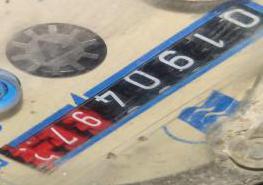
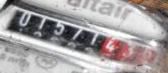
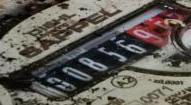
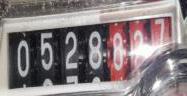
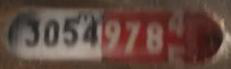
...
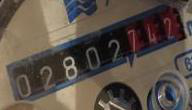
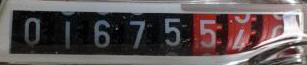
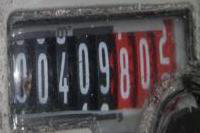
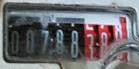
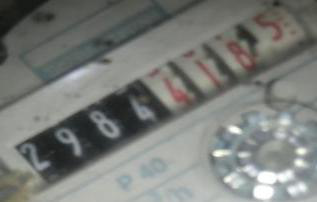

In [11]:
from IPython.core.display import display, HTML
from PIL import Image
import base64
import io
import pandas as pd

data = pd.DataFrame()
for ind, row in enumerate(output[output.index('image_path               \tpredicted_labels         \tconfidence score')+2:]):
    try:
        row = row.split('\t')
        filename = row[0].strip()
#         print(row)
#         print(filename)
        label = row[1].strip()
        conf = row[2].strip()
        img = Image.open(filename)
        img_buffer = io.BytesIO()
        img.save(img_buffer, format="PNG")
        imgStr = base64.b64encode(img_buffer.getvalue()).decode("utf-8") 

        data.loc[ind, 'img'] = '<img src="data:image/png;base64,{0:s}">'.format(imgStr)
        data.loc[ind, 'id'] = filename
        data.loc[ind, 'label'] = label
        data.loc[ind, 'conf'] = conf
        
    except: print('')

html_all = data.to_html(escape=False)
display(HTML(html_all))